In [2]:
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.path import Path
import sys, os
from matplotlib.colors import ListedColormap, BoundaryNorm
import pandas as pd
import ast


In [3]:
def read_contour(file_path):
    x_coords, y_coords = [], []
    with open(file_path, 'r') as file:
        for line in file:
            x_str, y_str = line.strip().split()
            x_coords.append(float(x_str))
            y_coords.append(float(y_str))
    x_coords.append(x_coords[0])
    y_coords.append(y_coords[0])
    return x_coords, y_coords


def create_ring_mask_with_hole( outer_boundary, inner_boundary, grid_size=None):
    """
    Creates a mask with different labels for various regions:
    - 0: Outside the outer boundary
    - 2: Between outer and inner boundaries (the ring region)
    - 3: Inside the inner boundary
    
    Parameters:
    -----------
    outer_x, outer_y : array-like
        X and Y coordinates of the outer boundary
    inner_x, inner_y : array-like
        X and Y coordinates of the inner boundary
    grid_size : tuple, optional
        Size of the output grid (height, width). If None, uses the actual coordinate range.
    plot_result : bool
        Whether to plot the result
    
    Returns:
    --------
    mask : numpy.ndarray
        Labeled mask with:
        - 0 outside the outer boundary
        - 2 in the ring region
        - 3 inside the inner boundary
    x, y : numpy.ndarray
        Coordinate arrays used for the mask
    """
    
    # Create Path objects from the boundaries
    outer_path = Path(outer_boundary)
    inner_path = Path(inner_boundary)

    outer_x = outer_boundary[:,0]
    outer_y = outer_boundary[:,1]
    inner_x = inner_boundary[:,0]
    inner_y = inner_boundary[:,1]
    
    # Determine grid size
    if grid_size is None:

        # Bounds from the boundaries
        x_min_data = 0
        x_max_data = 256
        y_min_data = 0
        y_max_data = 256

        # Compute data width/height
        x_range = x_max_data - x_min_data
        y_range = y_max_data - y_min_data

        # Resolution for 47 pixels in data range
        x_res = x_range / 256
        y_res = y_range / 256

        # Add 10 pixel margin on each side using same resolution
        x_margin = 0
        y_margin = 0

        # Final x and y coordinate arrays
        x = np.linspace(x_min_data - x_margin, x_max_data + x_margin, 256)
        y = np.linspace(y_min_data - y_margin, y_max_data + y_margin, 256)
    else:
        # If grid_size is provided, use it
        x = np.linspace(0, grid_size[1]-1, grid_size[1])
        y = np.linspace(0, grid_size[0]-1, grid_size[0])
    
    X, Y = np.meshgrid(x, y)
    points = np.column_stack([X.ravel(), Y.ravel()])
    
    mask = np.zeros_like(X, dtype=int)

    # Test which points are inside each path
    mask_outer = outer_path.contains_points(points)
    mask_inner = inner_path.contains_points(points)

    inner_mask = mask_inner.reshape(X.shape)
    outer_mask = mask_outer.reshape(X.shape)

    #label the blood pool
    mask[mask_inner.reshape(X.shape)] = 3
    
    # Label the ring region (between outer and inner boundaries) with 2
    mask[(mask_outer.reshape(X.shape)) & (~mask_inner.reshape(X.shape))] = 2
    
    return mask, x, y, outer_boundary, inner_boundary

def dice_score(y_true, y_pred, epsilon=0):
    intersection = np.sum((y_true == 1) & (y_pred == 1))
    volume_sum = np.sum(y_true == 1) + np.sum(y_pred == 1)
    return (2. * intersection + epsilon) / (volume_sum + epsilon)


def transform_slices(values):
    """
    Convert integers to 4-character strings with leading zeros.
    
    Args:
        values (list of int): input integers
    
    Returns:
        list of str: zero-padded strings
    """
    return [f"{v:04d}" for v in values]

In [35]:
# Your colors
colors = {
    0: "#00000000",   # black, fully transparent
    1: "#C10E2100",   # red, fully transparent
    2: "#2E8B57",   # green
    3: "#4B6FA5",   # modern blue
}

# Clean hex values (remove alpha channel 'ff')
color_list = [c[:7] for c in colors.values()]
labels = list(colors.keys())

# Create colormap and normalization
cmap = ListedColormap(color_list, name="custom_map")
norm = BoundaryNorm(range(len(color_list) + 1), cmap.N)

## For all Healthy datasets calculate the blood pool and myo dice and save them in Pandas Dataframes

In [50]:
pathology = "Heart_failure" #Healthy, Heart_failure_infarct, Heart_failure, LV_hypertrophy

In [52]:
def transform_slices(values):
    """
    Convert integers to 4-character strings with leading zeros.
    
    Args:
        values (list of int): input integers
    
    Returns:
        list of str: zero-padded strings
    """
    return [f"{v:04d}" for v in values]

In [53]:
columns = ["Dataset", "BP_dice", "Myo_dice", "mean_bp_dice", "mean_myo_dice", "std_bp_dice", "std_myo_dice"]
df_results = pd.DataFrame(columns=columns)

In [54]:
dict_healthy= {
    "SCD0003701": "SC-N-02",  
    "SCD0003801": "SC-N-03",
    #"SCD0003901": "SC-N-05", #issue 160 is found in manual contours but not in automatic segmentation. This is the wierd data set anyways
    "SCD0004001": "SC-N-06",
    "SCD0004101": "SC-N-07",
    "SCD0004201": "SC-N-09",
    "SCD0004301": "SC-N-10",
    "SCD0004401": "SC-N-11", 
    "SCD0004501": "SC-N-40",
}

dict_heart_failure_w_infarct = {
    "SCD0000101": "SC-HF-I-01",
    "SCD0000201": "SC-HF-I-02",
    "SCD0000301": "SC-HF-I-04", #issue start 20 end 200
    "SCD0000401": "SC-HF-I-05",
    "SCD0000501": "SC-HF-I-06",
    "SCD0000601": "SC-HF-I-07", #Issue start 20 end 160
    "SCD0000701": "SC-HF-I-08",
    "SCD0000801": "SC-HF-I-09",
    "SCD0000901": "SC-HF-I-10",
    "SCD0001001": "SC-HF-I-11",
    "SCD0001101": "SC-HF-I-12",
    "SCD0001201": "SC-HF-I-40"
}

dict_heart_failure = {
    "SCD0001301": "SC-HF-NI-03",
    "SCD0001401": "SC-HF-NI-04",
    "SCD0001501": "SC-HF-NI-07",
    "SCD0001601": "SC-HF-NI-11",
    "SCD0001701": "SC-HF-NI-12",
    "SCD0001801": "SC-HF-NI-13", #issue start 40 end 220
    "SCD0001901": "SC-HF-NI-14",
    "SCD0002001": "SC-HF-NI-15", #issue start 80 end 220
    "SCD0002101": "SC-HF-NI-31",
    "SCD0002201": "SC-HF-NI-33",
    "SCD0002301": "SC-HF-NI-34",
    "SCD0002401": "SC-HF-NI-36"
}

dict_lv_hypertropy = {
    "SCD0002501": "SC-HYP-01", #issue start 60 end 180
    "SCD0002601": "SC-HYP-03",
    "SCD0002701": "SC-HYP-06",
    "SCD0002801": "SC-HYP-07",
    "SCD0002901": "SC-HYP-08", #issue start 60 end 240
    "SCD0003001": "SC-HYP-09",
    "SCD0003101": "SC-HYP-10", #issue start 20 end 180
    "SCD0003201": "SC-HYP-11",
    "SCD0003301": "SC-HYP-12", #issue start 20 end 180
    "SCD0003401": "SC-HYP-37",
    "SCD0003501": "SC-HYP-38",
    "SCD0003601": "SC-HYP-40"
}

#issue always is that the last one does not exist

In [55]:
#datasets that need to be flipped

flip_healthy = ["SCD0003801","SCD0004001","SCD0004101","SCD0004201","SCD0004301"]

flip_failure_infarct = ["SCD0000101","SCD0000401","SCD0000801"]

flip_failure = ["SCD0001601","SCD0001801", "SCD0001901","SCD0002001", "SCD0002301"]

flip_lv_hyper = [ "SCD0002701","SCD0002801","SCD0003001","SCD0003201","SCD0003401"]

In [56]:


if pathology == "Healthy":
    dict = dict_healthy
    flip = flip_healthy

elif pathology == "Heart_failure_infarct":
    dict = dict_heart_failure_w_infarct
    flip = flip_failure_infarct


elif pathology == "Heart_failure":
    dict = dict_heart_failure
    flip = flip_failure

else:
    dict = dict_lv_hypertropy
    flip = flip_lv_hyper

In [57]:
#load manual segmentation
df = pd.read_csv("/data.lfpn/ibraun/Code/paper_volume_calculation/manual_segmentation.csv",header = None)

df[0] = df[0].str.strip("'")

{'SCD0001301': 'SC-HF-NI-03', 'SCD0001401': 'SC-HF-NI-04', 'SCD0001501': 'SC-HF-NI-07', 'SCD0001601': 'SC-HF-NI-11', 'SCD0001701': 'SC-HF-NI-12', 'SCD0001801': 'SC-HF-NI-13', 'SCD0001901': 'SC-HF-NI-14', 'SCD0002001': 'SC-HF-NI-15', 'SCD0002101': 'SC-HF-NI-31', 'SCD0002201': 'SC-HF-NI-33', 'SCD0002301': 'SC-HF-NI-34', 'SCD0002401': 'SC-HF-NI-36'}
10
10
10
10
12
12
10
10
13
13
10
10
8
8
8
8
10
10
10
10
10
10
9
9


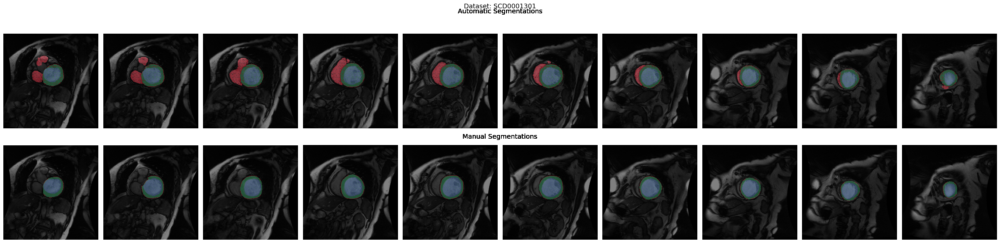

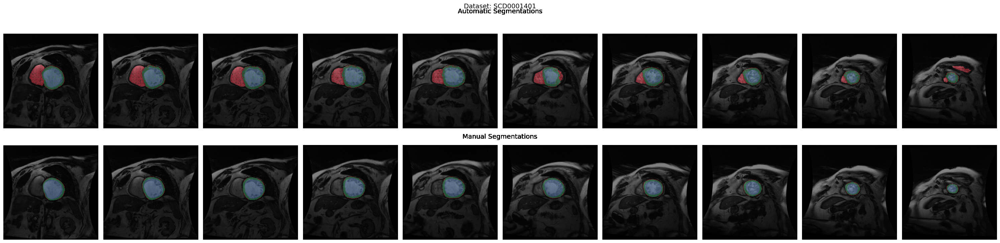

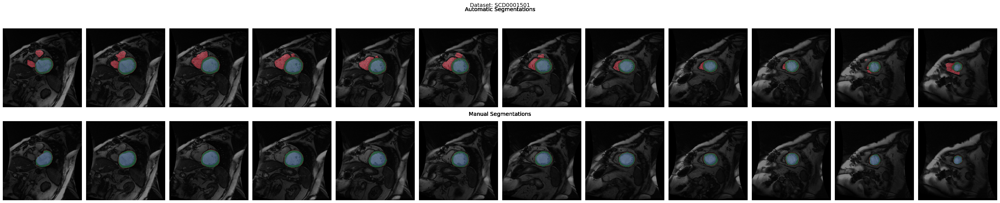

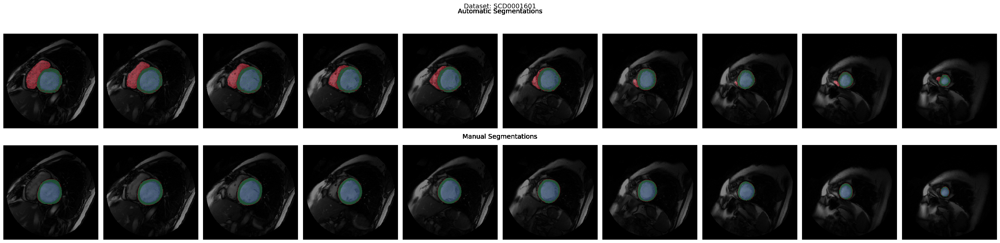

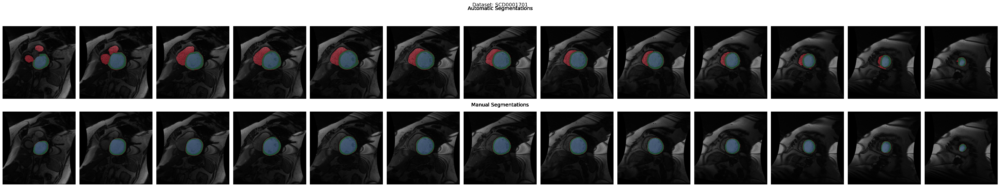

...

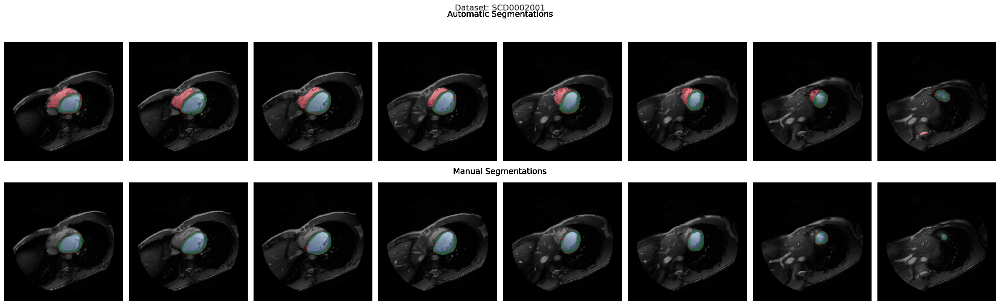

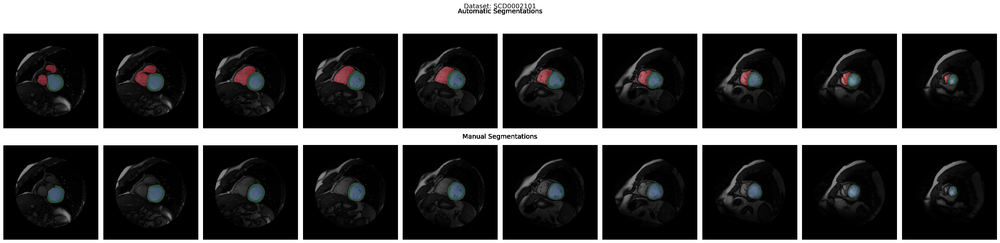

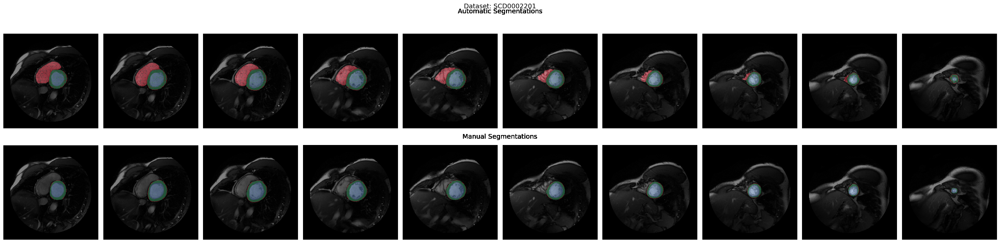

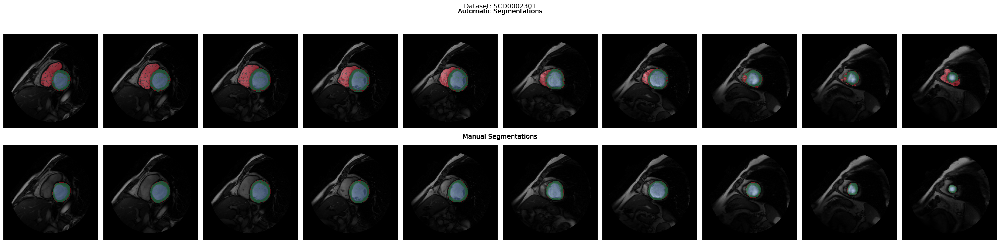

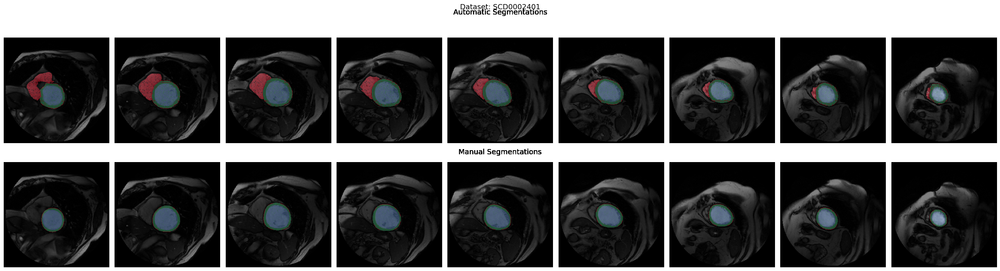

In [58]:
print(dict)
for dataset in dict:

    z_slices = df.loc[df[0] == dataset, 1].values[0]
    z_slices = ast.literal_eval(z_slices)
    z_slices = [int(x) for x in z_slices]

    z_slices_manu = transform_slices(z_slices)

    # Temporary lists per dataset
    manual_masks_bp = []
    automated_masks_bp = []
    manual_masks_myo = []
    automated_masks_myo = []

    dice_scores_bp = []
    dice_scores_myo = []

    # Create figure for this dataset
    fig, axes = plt.subplots(2, len(z_slices_manu), figsize=(3 * len(z_slices_manu), 8))
    if len(z_slices_manu) == 1:
        axes = np.array([[axes[0]], [axes[1]]])  # Make it 2D for consistency

    for i, index in enumerate(z_slices_manu):
        try:
            # Load masks, contours, MRI etc. (your existing code)
            icontour_file = f"/data.lfpn/ibraun/Code/paper_volume_calculation/Patient_Segmentations/SCD_ManualContours/{pathology}/{dict[dataset]}/contours-manual/IRCCI-expert/IM-0001-{index}-icontour-manual.txt"
            ocontour_file = f"/data.lfpn/ibraun/Code/paper_volume_calculation/Patient_Segmentations/SCD_ManualContours/{pathology}/{dict[dataset]}/contours-manual/IRCCI-expert/IM-0001-{index}-ocontour-manual.txt"

            ix, iy = read_contour(icontour_file)
            ox, oy = read_contour(ocontour_file)
            inner_boundary = np.stack([ix, iy], axis=1)
            outer_boundary = np.stack([ox, oy], axis=1)

            mask_gen, x, y, outer_boundary, inner_boundary = create_ring_mask_with_hole(outer_boundary, inner_boundary)

            mri_image = np.load(f"/data.lfpn/ibraun/Code/paper_volume_calculation/outputs_patient_data/final_results/{dataset}/seg_masks/mri_data_{z_slices[i]}.0.npy")
            mask_loaded = np.load(f"/data.lfpn/ibraun/Code/paper_volume_calculation/outputs_patient_data/final_results/{dataset}/seg_masks/seg_mask_{z_slices[i]}.0.npy")

            rotated_mask = np.flipud(np.rot90(mask_loaded, k=1))
            rotated_mri = np.flipud(np.rot90(mri_image, k=1))

            manual_masks_bp.append((mask_gen == 3).astype(np.uint8))
            manual_masks_myo.append((mask_gen == 2).astype(np.uint8))
            automated_masks_bp.append((rotated_mask == 3).astype(np.uint8))
            automated_masks_myo.append((rotated_mask == 2).astype(np.uint8))

            score_bp = dice_score(manual_masks_bp[i], automated_masks_bp[i])
            score_myo = dice_score(manual_masks_myo[i], automated_masks_myo[i])
            dice_scores_bp.append(round(score_bp, 3))
            dice_scores_myo.append(round(score_myo, 3))

            # --- Plotting ---
            ax1 = axes[0, i]
            ax1.imshow(rotated_mri, cmap='gray')
            ax1.imshow(rotated_mask, cmap=cmap, norm=norm, alpha=0.5)
            ax1.axis('off')

            ax2 = axes[1, i]
            ax2.imshow(rotated_mri, cmap='gray')
            ax2.imshow(mask_gen, cmap=cmap, norm=norm, alpha=0.5)
            # ax2.plot(ix, iy, 'black', linewidth=1.5)
            # ax2.plot(ox, oy, 'black', linewidth=1.5)
            ax2.axis('off')

            top_row_bbox = axes[0, 0].get_position()    # returns Bbox: [x0, y0, x1, y1]
            bottom_row_bbox = axes[1, 0].get_position()

            y_top_title = top_row_bbox.y1        # slightly above top row
            y_bottom_title = bottom_row_bbox.y1  # slightly above bottom row

            fig.text(0.5, 0.95, 'Automatic Segmentations', ha='center', va='center', fontsize=14)
            fig.text(0.5, 0.48, 'Manual Segmentations', ha='center', va='center', fontsize=14)


        except FileNotFoundError as e:
            print(f"Error: {e}")

    fig.suptitle(f"Dataset: {dataset}", fontsize=14)
    plt.tight_layout()
    # plt.savefig(f"/data.lfpn/ibraun/Code/paper_volume_calculation/Results_Seg_Comparison/{pathology}/{dataset}_manu_vs_auto_seg.svg")
    # plt.savefig(f"/data.lfpn/ibraun/Code/paper_volume_calculation/Results_Seg_Comparison/{pathology}/{dataset}_manu_vs_auto_seg.pdf",dpi=300)
    # plt.show()

    print(len(dice_scores_bp))
    print(len(dice_scores_myo))

    # Save results for this dataset
    df_results = pd.concat(
        [df_results, pd.DataFrame([[dataset, dice_scores_bp, dice_scores_myo, 
                                    np.mean(dice_scores_bp), np.mean(dice_scores_myo),
                                    np.std(dice_scores_bp), np.std(dice_scores_myo)]], 
                                   columns=columns)],
        ignore_index=True
    )



# df_results.to_csv(f"/data.lfpn/ibraun/Code/paper_volume_calculation/Results_Seg_Comparison/{pathology}/{pathology}_dice_scores.csv", index=False)


NameError: name 'cmap' is not defined

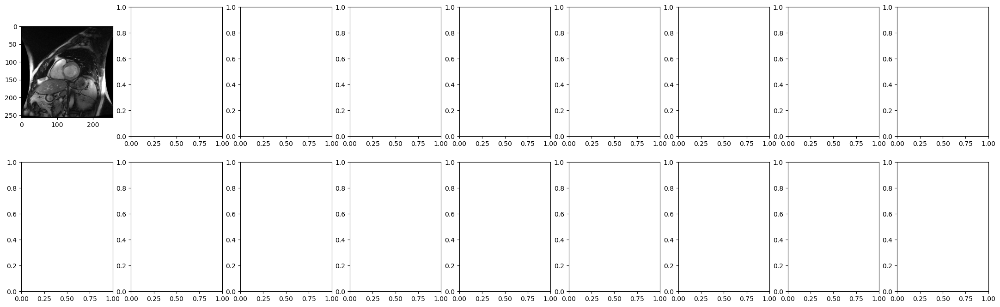

In [12]:
dict = dict_healthy
pathology = "Healthy"
dataset = "SCD0003701"

z_slices = df.loc[df[0] == dataset, 1].values[0]
z_slices = ast.literal_eval(z_slices)
z_slices = [int(x) for x in z_slices]

z_slices_manu = transform_slices(z_slices)

# Temporary lists per dataset
manual_masks_bp = []
automated_masks_bp = []
manual_masks_myo = []
automated_masks_myo = []

automated_masks_bp_test = []
automated_masks_myo_test = []
dice_scores_bp_test = []
dice_scores_myo_test = []

dice_scores_bp = []
dice_scores_myo = []

# Create figure for this dataset
fig, axes = plt.subplots(2, len(z_slices_manu), figsize=(3 * len(z_slices_manu), 8))
if len(z_slices_manu) == 1:
    axes = np.array([[axes[0]], [axes[1]]])  # Make it 2D for consistency

for i, index in enumerate(z_slices_manu):
    try:
        # Load masks, contours, MRI etc. (your existing code)
        icontour_file = f"/data.lfpn/ibraun/Code/paper_volume_calculation/Patient_Segmentations/SCD_ManualContours/{pathology}/{dict[dataset]}/contours-manual/IRCCI-expert/IM-0001-{index}-icontour-manual.txt"
        ocontour_file = f"/data.lfpn/ibraun/Code/paper_volume_calculation/Patient_Segmentations/SCD_ManualContours/{pathology}/{dict[dataset]}/contours-manual/IRCCI-expert/IM-0001-{index}-ocontour-manual.txt"

        ix, iy = read_contour(icontour_file)
        ox, oy = read_contour(ocontour_file)
        inner_boundary = np.stack([ix, iy], axis=1)
        outer_boundary = np.stack([ox, oy], axis=1)

        mask_gen, x, y, outer_boundary, inner_boundary = create_ring_mask_with_hole(outer_boundary, inner_boundary)

        mri_image = np.load(f"/data.lfpn/ibraun/Code/paper_volume_calculation/outputs_patient_data/final_results/{dataset}/seg_masks/mri_data_{z_slices[i]}.0.npy")
        mask_loaded = np.load(f"/data.lfpn/ibraun/Code/paper_volume_calculation/outputs_patient_data/final_results/{dataset}/seg_masks/seg_mask_{z_slices[i]}.0.npy")

        rotated_mask = np.flipud(np.rot90(mask_loaded, k=1))
        rotated_mri = np.flipud(np.rot90(mri_image, k=1))

        manual_masks_bp.append((mask_gen == 3).astype(np.uint8))
        manual_masks_myo.append((mask_gen == 2).astype(np.uint8))
        automated_masks_bp.append((rotated_mask == 3).astype(np.uint8))
        automated_masks_myo.append((rotated_mask == 2).astype(np.uint8))

        score_bp = dice_score(manual_masks_bp[i], automated_masks_bp[i])
        score_myo = dice_score(manual_masks_myo[i], automated_masks_myo[i])
        dice_scores_bp.append(round(score_bp, 3))
        dice_scores_myo.append(round(score_myo, 3))

        # mask_loaded_test = np.load(f"/data.lfpn/ibraun/Code/paper_volume_calculation/Segmentation masks/prepped_masks_t00_z0{i+1}.npy")
        # rotated_mask_test =  np.flipud(np.rot90(mask_loaded, k=1))
        # automated_masks_bp_test.append((rotated_mask_test == 3).astype(np.uint8))
        # automated_masks_myo_test.append((rotated_mask_test == 2).astype(np.uint8))

        # score_bp = dice_score(manual_masks_bp[i], automated_masks_bp_test[i])
        # score_myo = dice_score(manual_masks_myo[i], automated_masks_myo_test[i])
        # dice_scores_bp_test.append(round(score_bp, 3))
        # dice_scores_myo_test.append(round(score_myo, 3))

        # --- Plotting ---
        ax1 = axes[0, i]
        ax1.imshow(rotated_mri, cmap='gray')
        ax1.imshow(rotated_mask, cmap=cmap, norm=norm, alpha=0.5)
        ax1.axis('off')

        ax2 = axes[1, i]
        ax2.imshow(rotated_mri, cmap='gray')
        ax2.imshow(mask_gen, cmap=cmap, norm=norm, alpha=0.5)
        # ax2.plot(ix, iy, 'black', linewidth=1.5)
        # ax2.plot(ox, oy, 'black', linewidth=1.5)
        ax2.axis('off')

        top_row_bbox = axes[0, 0].get_position()    # returns Bbox: [x0, y0, x1, y1]
        bottom_row_bbox = axes[1, 0].get_position()

        y_top_title = top_row_bbox.y1        # slightly above top row
        y_bottom_title = bottom_row_bbox.y1  # slightly above bottom row

        fig.text(0.5, 0.95, 'Automatic Segmentations', ha='center', va='center', fontsize=14)
        fig.text(0.5, 0.48, 'Manual Segmentations', ha='center', va='center', fontsize=14)


    except FileNotFoundError as e:
        print(f"Error: {e}")

fig.suptitle(f"Dataset: {dataset}", fontsize=14)
# plt.tight_layout()
# plt.savefig(f"/data.lfpn/ibraun/Code/paper_volume_calculation/Results_Seg_Comparison/{pathology}/{dataset}_manu_vs_auto_seg.svg")
# plt.savefig(f"/data.lfpn/ibraun/Code/paper_volume_calculation/Results_Seg_Comparison/{pathology}/{dataset}_manu_vs_auto_seg.pdf",dpi=300)
plt.show()

# Save results for this dataset
df_results = pd.concat(
    [df_results, pd.DataFrame([[dataset, dice_scores_bp, dice_scores_myo, 
                                np.mean(dice_scores_bp), np.mean(dice_scores_myo),
                                np.std(dice_scores_bp), np.std(dice_scores_myo)]], 
                                columns=columns)],
    ignore_index=True
)

print(dice_scores_bp)
print(np.mean(dice_scores_bp))

print(dice_scores_myo)
print(np.mean(dice_scores_myo))

## Plot manual segmentation masks overlaying automatic segmentation masks

(27, 8)


SystemExit: 

/home/ibraun/miniconda3/envs/lvmeshfitting/lib/python3.8/site-packages/IPython/core/interactiveshell.py:3516: UserWarning: To exit: use 'exit', 'quit', or Ctrl-D.
  warn("To exit: use 'exit', 'quit', or Ctrl-D.", stacklevel=1)


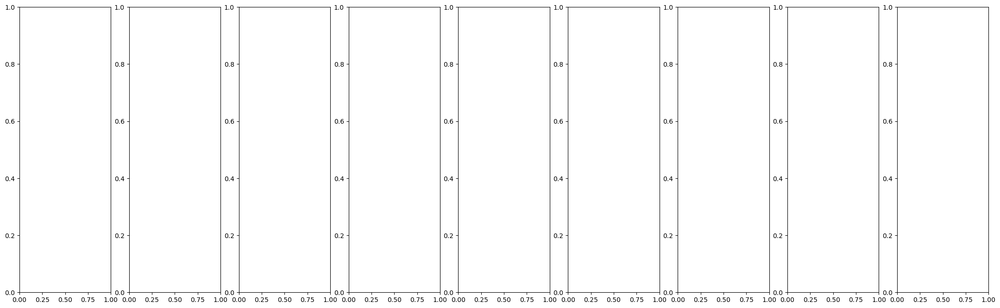

: 

In [ ]:
import builtins

manual_masks_bp = []
automated_masks_bp = []

manual_masks_myo = []
automated_masks_myo = []
rotated_masks = []



dataset = "SCD0003701"
df = pd.read_csv("/data.lfpn/ibraun/Code/paper_volume_calculation/manual_segmentation.csv",header = None)

df[0] = df[0].str.strip("'")
z_slices = df.loc[df[0] == dataset, 1].values[0]
z_slices = ast.literal_eval(z_slices)
z_slices = [int(x) for x in z_slices]

indices = transform_slices(z_slices)

#Calculate dice scores
dice_scores_bp = []
dice_scores_myo = []

fig, axes = plt.subplots(1, len(indices), figsize=(3 * len(indices), 2 * 4))  # 2 rows, 8 columns

print((3 * len(indices), 2 * 4))
sys.exit()


for i, index in enumerate(indices):

    try:
        #----- Top row: Generated mask -----
        icontour_file = f"/data.lfpn/ibraun/Code/paper_volume_calculation/Patient_Segmentations/SCD_ManualContours/Healthy/SC-N-02/contours-manual/IRCCI-expert/IM-0001-{index}-icontour-manual.txt"
        ocontour_file = f"/data.lfpn/ibraun/Code/paper_volume_calculation/Patient_Segmentations/SCD_ManualContours/Healthy/SC-N-02/contours-manual/IRCCI-expert/IM-0001-{index}-ocontour-manual.txt"

        ix, iy = read_contour(icontour_file)
        ox, oy = read_contour(ocontour_file)

        inner_boundary = np.stack([ix, iy], axis=1)
        outer_boundary = np.stack([ox, oy], axis=1)

        mask_gen, x, y, outer_boundary, inner_boundary = create_ring_mask_with_hole(outer_boundary, inner_boundary)

        manual_masks_bp.append((mask_gen == 3).astype(np.uint8))
        manual_masks_myo.append((mask_gen == 2).astype(np.uint8))

        mri_image = np.load(f"/data.lfpn/ibraun/Code/paper_volume_calculation/outputs_patient_data/final_results/{dataset}/seg_masks/mri_data_{z_slices[i]}.0.npy")
        mask_loaded = np.load(f"/data.lfpn/ibraun/Code/paper_volume_calculation/outputs_patient_data/final_results/{dataset}/seg_masks/seg_mask_{z_slices[i]}.0.npy")

        rotated_mask =  np.flipud(np.rot90(mask_loaded, k=1))
        rotated_mri = np.flipud(np.rot90(mri_image, k=1))

        automated_masks_bp.append((rotated_mask == 3).astype(np.uint8))
        automated_masks_myo.append((rotated_mask == 2).astype(np.uint8))

        score_bp= dice_score(manual_masks_bp[i], automated_masks_bp[i])
        dice_scores_bp.append(round(score_bp, 3))

        score_myo= dice_score(manual_masks_myo[i], automated_masks_myo[i])
        dice_scores_myo.append(round(score_myo, 3))

        # Crop parameters
        crop_size = 100
        h, w = rotated_mri.shape
        x_center, y_center = w // 2, h // 2  # center of the image

        x_start = max(0, x_center - crop_size // 2)
        x_end   = min(w, x_center + crop_size // 2)
        y_start = max(0, y_center - crop_size // 2)
        y_end   = min(h, y_center + crop_size // 2)

        # Crop the MRI and mask
        rotated_mri_cropped = rotated_mri[y_start:y_end, x_start:x_end]
        rotated_mask_cropped = rotated_mask[y_start:y_end, x_start:x_end]

        # Crop the contour coordinates as well
        ix_cropped = np.array(ix) - x_start
        iy_cropped = np.array(iy) - y_start
        ox_cropped = np.array(ox) - x_start
        oy_cropped = np.array(oy) - y_start

        # Plot MRI + contours
        ax = axes[i]
        ax.imshow(rotated_mri_cropped, cmap='gray')
        ax.imshow(rotated_mask_cropped, cmap=cmap, norm=norm, alpha=0.5)
        ax.plot(ix_cropped, iy_cropped, "#ffd166ff", linewidth=1.5)
        ax.plot(ox_cropped, oy_cropped, "#ffd166ff", linewidth=1.5)
        ax.axis('off')

        # Add Dice scores as text (bottom-left corner)
        ax.text(
            5, rotated_mask_cropped.shape[0] - 10,   # x,y pixel position
            f"Bp. Dice: {score_bp:.3f}\nMyo. Dice: {score_myo:.3f}",
            color="white",
            fontsize=10,
            bbox=builtins.dict(facecolor="black", alpha=0.5, edgecolor="none")
        )
    except FileNotFoundError as e:
            print(f"Error: {e}")

plt.savefig("/data.lfpn/ibraun/Code/paper_volume_calculation/Graphics/seg_manual_auto_healthy.pdf",dpi=300)
plt.savefig("/data.lfpn/ibraun/Code/paper_volume_calculation/Graphics/seg_manual_auto_healthy.svg")

print(dice_scores_bp)
print(np.mean(dice_scores_bp))
print(dice_scores_myo)
print(np.mean(dice_scores_myo))

: 